In [119]:
import os
import math
import random
import numpy as np
import pandas as pd
from pylab import plt, mpl
plt.style.use('seaborn-v0_8')
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['font.family'] = 'serif'
os.environ['PYTHONHASHSEED'] = '0'

In [120]:
import gym

In [121]:
env = gym.make('CartPole-v1')

In [122]:
# env.seed(100)

In [123]:
env.action_space.seed(100)

[100]

In [124]:
env.observation_space

Box([-4.8000002e+00 -3.4028235e+38 -4.1887903e-01 -3.4028235e+38], [4.8000002e+00 3.4028235e+38 4.1887903e-01 3.4028235e+38], (4,), float32)

In [125]:
env.observation_space.low.astype(np.float16)

array([-4.8  ,   -inf, -0.419,   -inf], dtype=float16)

In [126]:
env.observation_space.high.astype(np.float16)

array([4.8  ,   inf, 0.419,   inf], dtype=float16)

In [127]:
state = env.reset()

In [128]:
state

(array([ 0.01486521,  0.04761644,  0.04281494, -0.00856673], dtype=float32),
 {})

In [129]:
env.action_space

Discrete(2)

In [130]:
env.action_space.n

2

In [131]:
env.action_space.sample()

1

In [132]:
a = env.action_space.sample()
a

1

In [133]:
state, reward, done, trunc, info = env.step(a)
state, reward, done, trunc, info

(array([ 0.01581754,  0.24209905,  0.04264361, -0.28743955], dtype=float32),
 1.0,
 False,
 False,
 {})

In [134]:
env.reset()

(array([-0.03423877, -0.04468081, -0.0307628 ,  0.02637053], dtype=float32),
 {})

In [135]:
for e in range(1, 200):
    a = env.action_space.sample()
    state, reward, done, trunc, info = env.step(a)
    print(f'step={e:2d} | state={state} | action={a} | reward={reward}')
    if done and (e + 1) < 200:
        print('*** FAILED ***')
        break

step= 1 | state=[-0.03513238 -0.2393484  -0.03023539  0.30919093] | action=0 | reward=1.0
step= 2 | state=[-0.03991935 -0.04380899 -0.02405157  0.00712801] | action=1 | reward=1.0
step= 3 | state=[-0.04079553 -0.2385779  -0.02390901  0.2921264 ] | action=0 | reward=1.0
step= 4 | state=[-0.04556709 -0.43335095 -0.01806649  0.5771739 ] | action=0 | reward=1.0
step= 5 | state=[-0.05423411 -0.6282151  -0.00652301  0.86411107] | action=0 | reward=1.0
step= 6 | state=[-0.06679841 -0.8232476   0.01075921  1.1547359 ] | action=0 | reward=1.0
step= 7 | state=[-0.08326336 -0.6282676   0.03385393  0.86544603] | action=1 | reward=1.0
step= 8 | state=[-0.09582871 -0.4336224   0.05116285  0.58359665] | action=1 | reward=1.0
step= 9 | state=[-0.10450116 -0.2392531   0.06283478  0.30745953] | action=1 | reward=1.0
step=10 | state=[-0.10928623 -0.04508016  0.06898398  0.03523617] | action=1 | reward=1.0
step=11 | state=[-0.11018783 -0.24112007  0.0696887   0.34886184] | action=0 | reward=1.0
step=12 | 

In [136]:
np.random.seed(100)

In [137]:
weights = np.random.random(4) * 2 - 1
weights

array([ 0.08680988, -0.44326123, -0.15096482,  0.68955226])

In [138]:
state = env.reset()

In [139]:
state[0]

array([-0.04615359, -0.02957998,  0.03965519, -0.00878687], dtype=float32)

In [140]:
s = np.dot(state[0], weights)
s

-0.0029404774534243713

In [141]:
if s < 0:
    a = 0
else:
    a = 1

In [142]:
a

0

In [155]:
def run_episode(env, weights):
    state = env.reset()[0]
    treward = 0
    for _ in range(200):
        s = np.dot(state, weights)
        a = 0 if s < 0 else 1
        state, reward, done, trunc, info = env.step(a)
        treward += reward
        if done:
            break
    return treward

In [156]:
run_episode(env,weights)

200.0

In [145]:
def set_seeds(seed=100):
    random.seed(seed)
    np.random.seed(seed)
    # env.seed(seed)

In [146]:
set_seeds()

In [147]:
num_episodes = 1000

In [148]:
besttreward = 0
for e in range(1, num_episodes + 1):
    weights = np.random.rand(4) * 2 - 1
    treward = run_episode(env, weights)
    if treward > besttreward:
        besttreward = treward
        bestweights = weights
        if treward >= 200:
            print(f'SUCCESS | episode={e}')
            break
        print(f'UPDATE | episode={e}')

UPDATE | episode=1
UPDATE | episode=2
SUCCESS | episode=13


In [149]:
weights

array([-0.42820862,  0.70479018,  0.95001299,  0.76970659])

In [150]:
res = []
for _ in range(100):
    treward = run_episode(env, weights)
    res.append(treward)
res[:10]

[200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0, 200.0]

In [151]:
sum(res) / len(res)

200.0

In [11]:
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.layers import Dense, Dropout
from keras.models import Sequential
from keras.optimizers.legacy import Adam, RMSprop
from sklearn.metrics import accuracy_score
from numpy import random

In [12]:
import gym

In [13]:
env = gym.make('CartPole-v1')

In [14]:
def set_seeds(seed=100):
    random.seed(seed)
    tf.random.set_seed(seed)
    env.action_space.seed(100)

In [15]:
class NNAgent:
    def __init__(self):
        self.max = 0
        self.scores = list()
        self.memory = list()
        self.model = self._build_model()

    def _build_model(self):
        model = Sequential()
        model.add(Dense(24, input_dim=4,
                        activation='relu'))
        model.add(Dense(1, activation='sigmoid'))
        model.compile(loss='binary_crossentropy',
                      optimizer=RMSprop(learning_rate=0.001))
        return model

    def act(self, state):
        if random.random() <= 0.5:
            return env.action_space.sample()

        action = np.where(self.model.predict(state, batch_size=None)[0, 0] > 0.5, 1, 0)
        return action

    def train_model(self, state, action):
        self.model.fit(state, np.array([action,]),
                       epochs=1, verbose=False)

    def learn(self, episodes):
        for e in range(1, episodes + 1):
            state = env.reset()[0]
            print(state)
            for _ in range(201):
                state = np.reshape(state, [1, 4])
                action = self.act(state)
                next_state, reward, done, trunc, info = env.step(action)
                if done:
                    score = _ + 1
                    self.scores.append(score)
                    self.max = max(score, self.max)
                    print('episode: {:4d}/{} | score: {:3d} | max: {:3d}'
                          .format(e, episodes, score, self.max), end='\r')
                    break
                self.memory.append((state, action))
                self.train_model(state, action)
                state = next_state

In [16]:
set_seeds(100)

In [17]:
agent = NNAgent()

In [24]:
episodes = 500

In [25]:
agent.learn(episodes)

[-0.00446983  0.0229534  -0.00475793  0.02979885]
1/1 [==============================] - 0s 8ms/step
[0.01299015 0.01521054 0.01139738 0.04103449]
1/1 [==============================] - 0s 7ms/step
[-0.00082533  0.00785986 -0.03206174  0.008589  ]
1/1 [==============================] - 0s 8ms/step
[-0.00626867  0.04896829  0.01209141  0.00238437]
1/1 [==============================] - 0s 8ms/step
[ 0.02439171  0.0232225  -0.007125    0.04724464]
1/1 [==============================] - 0s 7ms/step
[ 0.02126866 -0.02006485  0.04511756 -0.02894165]
1/1 [==============================] - 0s 8ms/step
[-0.04399747  0.0083686  -0.03181965 -0.04700074]
1/1 [==============================] - 0s 8ms/step
[ 0.00684572 -0.00222109  0.03101772  0.00707183]
1/1 [==============================] - 0s 7ms/step
[-0.02479699  0.02645096 -0.02020737  0.02869537]
1/1 [==============================] - 0s 8ms/step
[-0.02102609  0.01139727 -0.02905408 -0.02855991]
1/1 [==============================] - 0s 8ms

In [26]:
sum(agent.scores) / len(agent.scores)

13.947058823529412

In [27]:
f = np.array([m[0][0] for m in agent.memory])
f

array([[ 2.7545551e-03, -1.7006699e-02, -4.4729497e-02, -4.6142425e-02],
       [ 2.4144212e-03, -2.1145967e-01, -4.5652349e-02,  2.3209919e-01],
       [-1.8147721e-03, -1.5716128e-02, -4.1010365e-02, -7.4627317e-02],
       ...,
       [-3.8085118e-02, -9.5026428e-01,  8.8691384e-02,  1.4461209e+00],
       [-5.7090405e-02, -1.1463583e+00,  1.1761380e-01,  1.7651467e+00],
       [-8.0017567e-02, -1.3425970e+00,  1.5291674e-01,  2.0919702e+00]],
      dtype=float32)

In [28]:
l = np.array([m[1] for m in agent.memory])
l

array([0, 1, 1, ..., 0, 0, 1])

In [29]:
accuracy_score(np.where(agent.model.predict(f) > 0.5, 1, 0), l)

207/207 [==============================] - 0s 269us/step


0.7446615174920491

In [ ]:
import random
from collections import deque
from keras.optimizers.legacy import Adam, RMSprop

In [122]:
class DQLAgent:
    def __init__(self, gamma=0.95, hu=24, opt=Adam, lr=0.001, finish=False):
        self.finish = finish
        self.epsilon = 1.0
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.995
        self.gamma = gamma
        self.batch_size = 32
        self.max_treward = 0
        self.averages = list()
        self.memory = deque(maxlen=2000)
        self.osn = env.observation_space.shape[0]
        self.model = self._build_model(hu, opt, lr)

    def _build_model(self, hu, opt, lr):
        model = Sequential()
        model.add(Dense(hu, input_dim=self.osn, activation='relu'))
        model.add(Dense(hu, activation='relu'))
        model.add(Dense(env.action_space.n, activation='linear'))
        model.compile(loss='mse', optimizer=opt(lr=lr))
        return model

    def act(self, state):
        if random.random() <= self.epsilon:
            return env.action_space.sample()
        action = self.model.predict(state)[0]
        return np.argmax(action)

    def replay(self):
        batch = random.sample(self.memory, k=self.batch_size)
        for state, action, reward, next_state, done in batch:
            print(f'state: {state}, action: {action}, reward: {reward}, next_state: {next_state}, done: {done}')
            if not done:
                reward += self.gamma * np.amax(self.model.predict(next_state)[0])
            target = self.model.predict(state)
            target[0, action] = reward
            print(f'target: {target}')
            self.model.fit(state, target, epochs=1, verbose=0)

        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def learn(self, episodes):
        trewards = []
        for e in range(1, episodes + 1):
            state = env.reset()[0]
            state = np.reshape(state, [1, self.osn])

            for _ in range(5000):
                action = self.act(state)
                next_state, reward, done, trunc, info = env.step(action)
                next_state = np.reshape(next_state, [1, self.osn])
                self.memory.append([state, action, reward, next_state, done])
                state = next_state

                if done:
                    treward = _ + 1
                    trewards.append(treward)
                    av = sum(trewards[-25:]) / 25
                    self.averages.append(av)
                    self.max_treward = max(self.max_treward, treward)
                    templ = 'episode: {:4d}/{} | treward: {:4d} | av: {:6.1f} | max: {:4d}'
                    print(templ.format(e, episodes, treward, av, self.max_treward), end='\r')
                    break

            if av > 195 and self.finish:
                break
            if len(self.memory) > self.batch_size:
                self.replay()

    def test(self, episodes):
        trewards = []
        for e in range(1, episodes + 1):
            state = env.reset()
            for _ in range(5001):
                state = np.reshape(state, [1, self.osn])
                action = np.argmax(self.model.predict(state)[0])
                next_state, reward, done, trunc, info = env.step(action)
                state = next_state
                if done:
                    treward = _ + 1
                    trewards.append(treward)
                    print('episode: {:4d}/{} | treward: {:4d}'.format(e, episodes, treward), end='\r')
        return trewards

In [105]:
episodes = 1000
set_seeds(100)

In [106]:
agent = DQLAgent(finish=True)

/Users/taemin/anaconda3/lib/python3.10/site-packages/keras/src/optimizers/legacy/adam.py:118: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [107]:
agent.learn(episodes)

state: [[-0.01622081  0.19865194  0.00616564 -0.32998776]], action: 1, reward: 1.0, next_state: [[-1.2247770e-02  3.9368558e-01 -4.3412045e-04 -6.2071997e-01]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[0.03638975 1.0740255 ]]
state: [[ 0.02038786  0.5941086  -0.06797113 -1.0320698 ]], action: 1, reward: 1.0, next_state: [[ 0.03227003  0.79006565 -0.08861252 -1.3452947 ]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[0.1299608 1.1741623]]
state: [[-0.01601841  0.19623773 -0.06642722 -0.42894045]], action: 1, reward: 1.0, next_state: [[-0.01209365  0.39223444 -0.07500603 -0.7418024 ]], done: False
1/1 [==============================] - 0s 8ms/step
target: [[0.06205103 1.0963179 ]]
state: [[-0.01988792 -0.00132194 -0.05463366 -0.08176279]], action: 1, reward: 1.0, next_state: [[-0.01991436  0.19453889 -0.05626892 -0.39117   ]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[0.02334199 1.0546567 ]]
state:

KeyboardInterrupt: 

In [108]:
from pylab import plt, mpl
plt.style.use('seaborn')

/var/folders/j_/hylrqd052y9czkfmjyyc7n7r0000gn/T/ipykernel_15025/1332703399.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


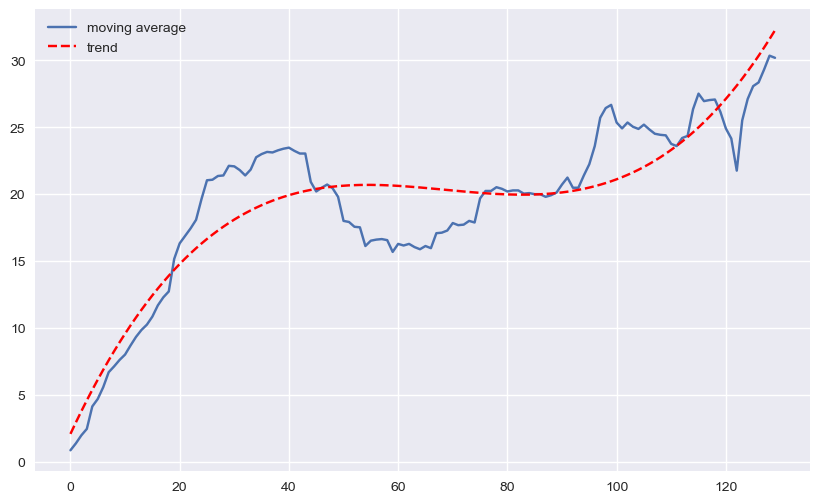

In [109]:
plt.figure(figsize=(10, 6))
x = range(len(agent.averages))
y = np.polyval(np.polyfit(x, agent.averages, deg=3), x)
plt.plot(agent.averages, label='moving average')
plt.plot(x, y, 'r--', label='trend')
plt.legend()

In [110]:
class observation_space:
    def __init__(self, n):
        self.shape = (n,)

In [111]:
class action_space:
    def __init__(self, n):
        self.n = n
    def seed(self, seed):
        pass
    def sample(self):
        return random.randint(0, self.n - 1)

In [124]:
class Finance:
    url = 'http://hilpisch.com/aiif_eikon_eod_data.csv'
    def __init__(self, symbol, features):
        self.symbol = symbol
        self.features = features
        self.observation_space = observation_space(4)
        self.osn = self.observation_space.shape[0]
        self.action_space = action_space(2)
        self.min_accuracy = 0.475
        self._get_data()
        self._prepare_data()

    def _get_data(self):
        self.raw = pd.read_csv(self.url, index_col=0, parse_dates=True).dropna()

    def _prepare_data(self):
        self.data = pd.DataFrame(self.raw[self.symbol])
        self.data['r'] = np.log(self.data / self.data.shift(1))
        self.data.dropna(inplace=True)
        self.data = (self.data - self.data.mean()) / self.data.std()
        self.data['d'] = np.where(self.data['r'] > 0, 1, 0)

    def _get_state(self):
        return self.data[self.features].iloc[
            self.bar - self.osn:self.bar
        ].values

    def seed(self, seed=None):
        pass

    def reset(self):
        self.treward = 0
        self.accuracy = 0
        self.bar = self.osn
        state = self.data[self.features].iloc[
            self.bar - self.osn:self.bar
        ]
        return [state.values]

    def step(self, action):
        correct = action == self.data['d'].iloc[self.bar]
        reward = 1 if correct else 0
        self.treward += reward
        self.bar += 1
        self.accuracy = self.treward / (self.bar - self.osn)
        if self.bar >= len(self.data):
            done = True
        elif reward == 1:
            done = False
        elif self.accuracy < self.min_accuracy and self.bar > self.osn + 10:
            done = True
        else:
            done = False
        state = self._get_state()
        info = {}
        return state, reward, done, False, info

In [125]:
env = Finance('EUR=', 'EUR=')

In [126]:
env.reset()

[array([1.81901285, 1.85786346, 1.77486442, 1.85786346])]

In [127]:
a = env.action_space.sample()
a

0

In [128]:
env.step(a)

(array([1.85786346, 1.77486442, 1.85786346, 1.94704329]), 0, False, False, {})

In [129]:
set_seeds(100)

In [130]:
agent = DQLAgent(gamma=0.5, opt=RMSprop)

/Users/taemin/anaconda3/lib/python3.10/site-packages/keras/src/optimizers/legacy/rmsprop.py:144: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [131]:
episodes = 1000

In [132]:
agent.learn(episodes)

state: [[1.58326024 1.57354758 1.61504711 1.6265257 ]], action: 1, reward: 0, next_state: [[1.57354758 1.61504711 1.6265257  1.55853712]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[-0.7965151  0.4270152]]
state: [[1.93026688 1.94439438 1.93733063 1.83137441]], action: 1, reward: 0, next_state: [[1.94439438 1.93733063 1.83137441 1.75720505]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[-0.9657776   0.40623465]]
state: [[1.81901285 1.85786346 1.77486442 1.85786346]], action: 0, reward: 0, next_state: [[1.85786346 1.77486442 1.85786346 1.94704329]], done: False
1/1 [==============================] - 0s 8ms/step
target: [[0.33632088 0.6631553 ]]
state: [[1.93733063 1.83137441 1.75720505 1.58326024]], action: 0, reward: 1, next_state: [[1.83137441 1.75720505 1.58326024 1.57354758]], done: False
1/1 [==============================] - 0s 7ms/step
target: [[1.2898057  0.61470985]]
state: [[1.94439438 1.93733063 1.83137441 1.75720505]]

KeyboardInterrupt: 

In [133]:
agent.test(3)

1/1 [==============================] - 0s 7ms/step


IndexError: single positional indexer is out-of-bounds

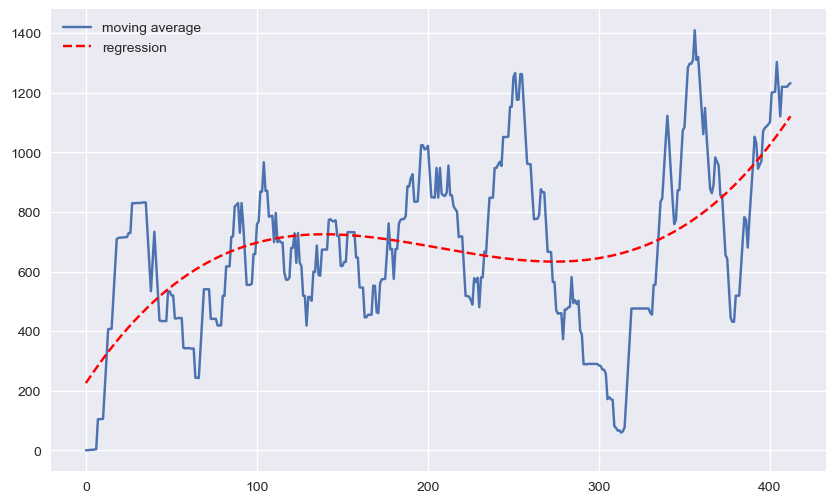

In [134]:
plt.figure(figsize=(10, 6))
x = range(len(agent.averages))
y = np.polyval(np.polyfit(x, agent.averages, deg=3), x)
plt.plot(agent.averages, label='moving average')
plt.plot(x, y, 'r--', label='regression')
plt.legend()